# DIPLOMADO CIENCIA MATEMÁTICA DE DATOS

## MODULO: REGRESION

### 23/05/2023

## Libraries

In [ ]:
#from sklearn.datasets import load_boston

In [ ]:
import pandas as pd
from sklearn.datasets import fetch_california_housing 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
import plotly.express as px
import matplotlib.pyplot as plt

## Data Loading

Data info: https://inria.github.io/scikit-learn-mooc/python_scripts/datasets_california_housing.html

In [ ]:
california = fetch_california_housing()
df = pd.DataFrame(california.data, columns = california.feature_names)
df['target'] = california.target
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [ ]:
print(california.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived

## Exploratory Analysis

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   MedInc      20640 non-null  float64
 1   HouseAge    20640 non-null  float64
 2   AveRooms    20640 non-null  float64
 3   AveBedrms   20640 non-null  float64
 4   Population  20640 non-null  float64
 5   AveOccup    20640 non-null  float64
 6   Latitude    20640 non-null  float64
 7   Longitude   20640 non-null  float64
 8   target      20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [ ]:
df.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


In [ ]:
fig = px.scatter_mapbox(df, lat='Latitude', lon='Longitude', color='target', hover_data=['AveRooms', 'AveBedrms'],
                        mapbox_style='open-street-map', zoom = 3.8, title='California Housing - Map Visualization')
fig.update_layout(autosize=True)
fig.show()

In [ ]:
fig = px.box(df.drop('target', axis = 1), title = 'Boxplot of Features')
fig.update_layout(xaxis_title = 'Features', yaxis_title = 'Values', template = 'plotly_white')
fig.show()

In [ ]:
fig = px.histogram(df, x = 'target', nbins = 30, title = 'Distribution of House Prices')
fig.update_layout(xaxis_title = 'House Price', yaxis_title = 'Frequency', template = 'plotly_white', bargap = 0.2)
fig.show()

In [ ]:
corr_matrix = df.corr()
fig = px.imshow(corr_matrix, x = corr_matrix.columns, y = corr_matrix.columns, color_continuous_scale = 'RdBu',  range_color=[-1,1], text_auto = True, aspect = "auto")
fig.update_layout(title='Correlation Heatmap')
fig.update(layout_coloraxis_showscale=False)
fig.show()

In [ ]:
fig = px.scatter_matrix(df, dimensions=df.columns[:-1], title='Pairwise Scatter Plot', height = 1000, color = 'target')
fig.update_traces(diagonal_visible=False)
fig.show()

## Regression Models

In [ ]:
X = df.drop('target', axis=1)
y = df['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Support Vector Machines

(https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html)

*Support Vector Machines (SVM)* can also be used for regression tasks. In SVM regression, the algorithm aims to find a hyperplane that approximates the mapping from the input variables to the continuous target variable. SVM regression tries to minimize the error between the predicted and actual values, while allowing for a certain degree of error tolerance.

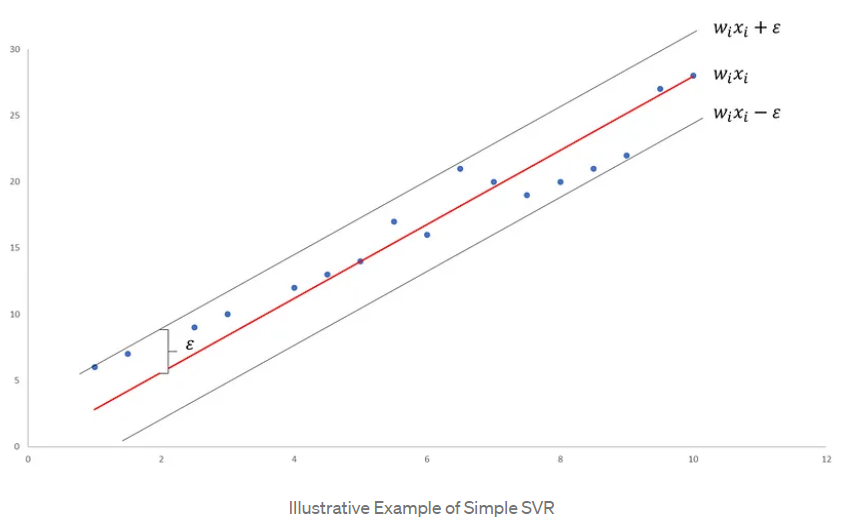

The Support Vector Regression (SVR) algorithm is a supervised machine learning algorithm used for regression tasks. It is an extension of the Support Vector Machine (SVM) algorithm for classification. While SVM aims to find a hyperplane that separates different classes, SVR seeks to find a hyperplane that fits the data points within a certain margin or epsilon.

Here's an overview of how the SVR algorithm works and the key parameters involved:

* *Data Transformation:* SVR can handle non-linear data by transforming the input features using kernel functions. The transformed features allow SVR to find a hyperplane in a higher-dimensional space that can better fit the data.

* *Hyperplane:* In SVR, the hyperplane represents the regression line that fits the data within a certain margin or epsilon. The goal is to find the hyperplane that maximizes the margin while minimizing the number of data points that fall outside the margin.

* *Epsilon:* Epsilon (ε) is a parameter that defines the width of the margin or tube around the regression line. It determines the acceptable deviation of the predicted values from the actual values. Data points falling within the margin are considered as support vectors and do not contribute to the loss function.

* *Loss Function:* SVR uses a loss function to measure the deviation of the predicted values from the actual values. The loss function penalizes data points that fall outside the margin or tube. Commonly used loss functions include epsilon-insensitive loss, quadratic loss, and L1 loss.

* *Regularization Parameter (C):* The regularization parameter (C) controls the trade-off between minimizing the loss and maximizing the margin. A smaller C value allows more deviation from the margin, allowing more errors but resulting in a wider margin. Conversely, a larger C value penalizes more for errors, leading to a narrower margin.

* *Kernel Functions:* SVR employs kernel functions to transform the input

#### Train Model

In [ ]:
svm = SVR()
svm.fit(X_train_scaled, y_train)

SVR()

#### Evaluate Model

In [ ]:
y_pred_svm = svm.predict(X_test_scaled)
mse_svm = mean_squared_error(y_test, y_pred_svm)
print(f"SVM MSE: {mse_svm:.2f}")

SVM MSE: 0.36


In [ ]:
svm_r2 = r2_score(y_test, y_pred_svm)
print(f"SVM R^2 Score: {svm_r2:.2f}")

SVM R^2 Score: 0.73


#### Tune Model

In [ ]:
param_grid_svm = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'poly', 'rbf']
}

In [ ]:
svm = SVR()
grid_search_svm = GridSearchCV(estimator = svm, param_grid=param_grid_svm, cv=5)
grid_search_svm.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=SVR(),
             param_grid={'C': [0.1, 1, 10],
                         'kernel': ['linear', 'poly', 'rbf']})

In [ ]:
best_params_svm = grid_search_svm.best_params_
best_params_svm

{'C': 10, 'kernel': 'rbf'}

In [ ]:
best_model_svm = grid_search_svm.best_estimator_
best_model_svm

SVR(C=10)

In [ ]:
y_pred_best_svm = best_model_svm.predict(X_test_scaled)
mse_best_svm = mean_squared_error(y_test, y_pred_best_svm)
print(f"SVM MSE: {mse_best_svm:.2f}")

SVM MSE: 0.32


In [ ]:
#svm_score = best_model_svm.score(y_test.values, y_pred_best_svm)
#print(f"SVM R^2 Score: {svm_score:.2f}")

### Decision Trees

(https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html)

Decision trees are versatile machine learning models that can be used for both classification and regression tasks. In the case of regression, decision trees aim to create a model that predicts the value of a continuous target variable by learning simple decision rules inferred from the input features. Decision trees recursively split the data based on feature values, creating a tree-like structure to make predictions.

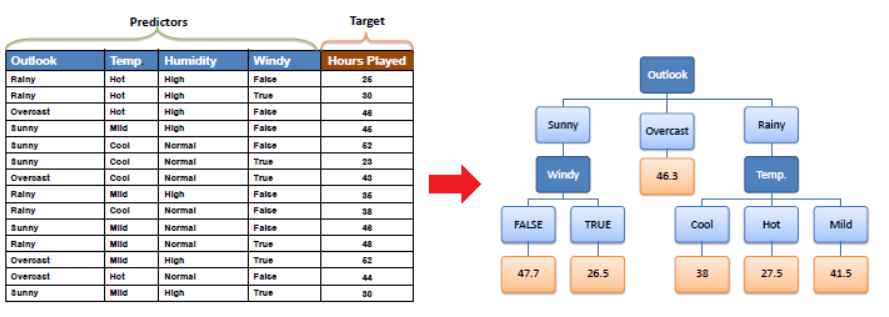

The Decision Tree regression algorithm is a supervised machine learning algorithm used for regression tasks. It works by recursively partitioning the data into subsets based on feature values and creating a tree-like structure of decision nodes and leaf nodes. Each internal node represents a test on a specific feature, and each leaf node represents a predicted value.

Here's an overview of how the Decision Tree regression algorithm works and the key parameters involved:

1. *Splitting Criterion:* Decision Trees use a splitting criterion to determine the feature and value at each internal node to split the data. Common splitting criteria include:

   * **Mean Squared Error (MSE):** Measures the variance or spread of the target variable within each subset. The split that minimizes the MSE is chosen.

   * **Mean Absolute Error (MAE):** Measures the average absolute difference between the predicted and actual values within each subset. The split that minimizes the MAE is chosen.

2. *Recursive Partitioning:* Decision Trees recursively split the data based on the selected splitting criterion until a stopping condition is met. This process results in a tree-like structure where each internal node represents a splitting condition and each leaf node represents a predicted value.

3. *Stopping Criteria:* Several stopping criteria can be used to determine when to stop the recursive partitioning process. Common stopping criteria include:

   * **Maximum Depth:** Limiting the depth of the tree by setting a maximum number of levels.

   * **Minimum Samples Split:** Specifying the minimum number of samples required to split an internal node.

   * **Minimum Samples Leaf:** Specifying the minimum number of samples required to create a leaf node.

4. *Pruning:* Decision Trees can be prone to overfitting, meaning they may memorize the training data too well and perform poorly on new, unseen data. Pruning techniques, such as cost complexity pruning (also known as "alpha" pruning), can be applied to reduce the complexity of the tree and improve generalization.

5. *Feature Importance:* Decision Trees provide a measure of feature importance, indicating the relevance of each feature in making predictions. Feature importance is calculated based on the number of times a feature is used for splitting and the improvement in the splitting criterion achieved by that feature.

6. *Hyperparameters:* Decision Trees have various hyperparameters that can be tuned to control the tree's complexity, generalization, and regularization. Some important hyperparameters include:

   * **Maximum Depth:** Specifies the maximum depth or levels of the tree.

   * **Minimum Samples Split:** Defines the minimum number of samples required to split an internal node.

   * **Minimum Samples Leaf:** Specifies the minimum number of samples required to create a leaf node.

   * **Maximum Features:** Controls the number of features considered for each split.

   * **Pruning Parameters:** Parameters related to pruning, such as the complexity parameter in cost complexity pruning.

Decision Trees are intuitive and interpretable models that can handle both numerical and categorical features. They can capture non-linear relationships and interactions between features. However, Decision Trees are prone to overfitting and may create complex trees that do not generalize well to unseen data. Proper tuning of hyperparameters, use of pruning techniques, and ensemble methods like Random Forest can help address these limitations.

By understanding the working principles and parameters of Decision Trees, you can effectively build and fine-tune regression models using this algorithm to solve a wide range of regression problems.

#### Train Model

In [ ]:
dt = DecisionTreeRegressor(random_state=42)
dt.fit(X_train_scaled, y_train)

DecisionTreeRegressor(random_state=42)

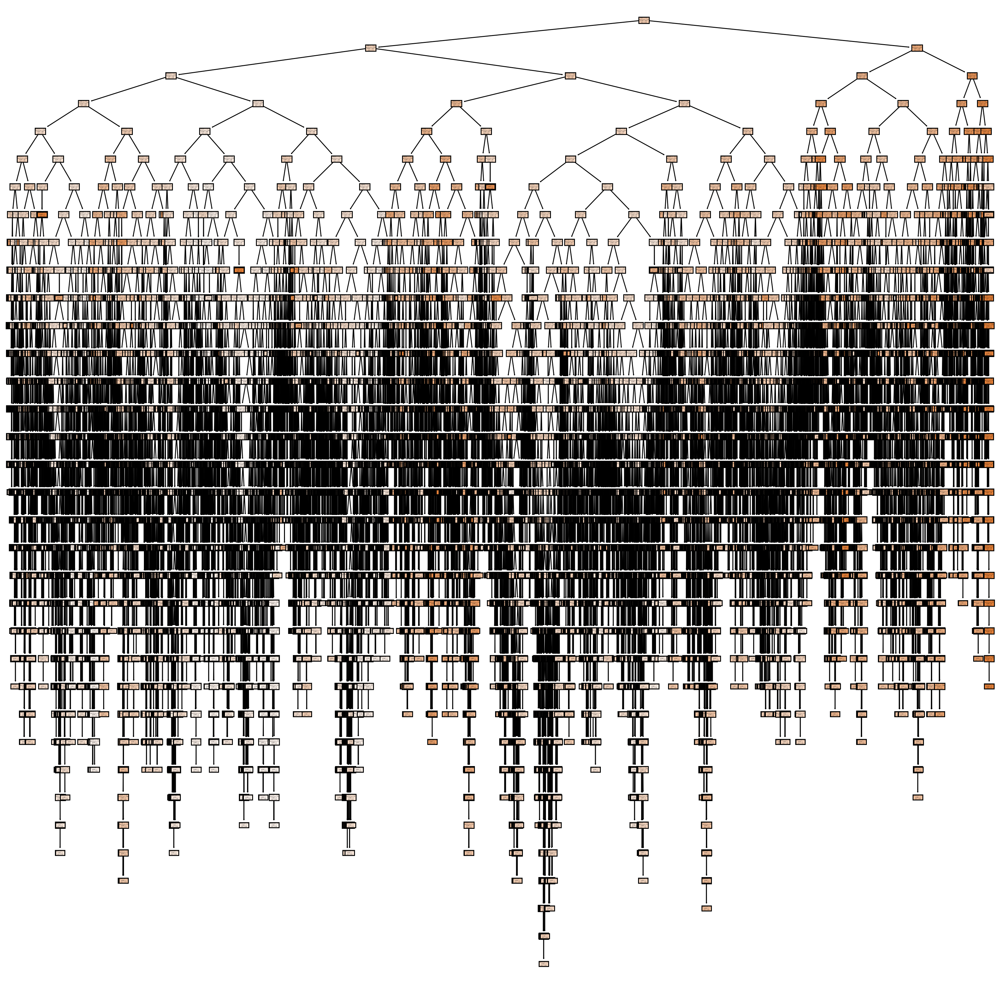

In [ ]:
plt.figure(figsize=(20, 20), dpi=200)
plot_tree(dt, feature_names = df.columns[:-1], filled=True)
plt.show()

#### Evaluate Model

In [ ]:
y_pred_dt = dt.predict(X_test_scaled)
mse_dt = mean_squared_error(y_test, y_pred_dt)
print(f"Decision Trees MSE: {mse_dt:.2f}")

Decision Trees MSE: 0.49


In [ ]:
dt_r2 = r2_score(y_test, y_pred_dt)
print(f"DT R^2 Score: {dt_r2:.2f}")

DT R^2 Score: 0.62


### Tune Model

In [ ]:
param_grid_dt = {
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'criterion': ['friedman_mse', 'absolute_error', 'squared_error']}

In [ ]:
dt = DecisionTreeRegressor(random_state=42)
grid_search_dt = GridSearchCV(estimator=dt, param_grid=param_grid_dt, cv=5)
grid_search_dt.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=42),
             param_grid={'criterion': ['friedman_mse', 'absolute_error',
                                       'squared_error'],
                         'max_depth': [None, 5, 10],
                         'min_samples_split': [2, 5, 10]})

In [ ]:
best_params_dt = grid_search_dt.best_params_
best_params_dt

{'criterion': 'friedman_mse', 'max_depth': 10, 'min_samples_split': 10}

In [ ]:
best_model_dt = grid_search_dt.best_estimator_
best_model_dt

DecisionTreeRegressor(criterion='friedman_mse', max_depth=10,
                      min_samples_split=10, random_state=42)

In [ ]:
y_pred_best_dt = best_model_dt.predict(X_test_scaled)
mse_best_dt = mean_squared_error(y_test, y_pred_best_dt)
print(f"DT MSE: {mse_best_dt:.2f}")

DT MSE: 0.42


In [ ]:
#dt_score = best_model_dt.score(y_test.values, y_pred_best_dt)
#print(f"DT R^2 Score: {dt_score:.2f}")

### Random Forest

(https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html)

Random Forest is an ensemble learning method that combines multiple decision trees to make predictions. In the case of regression, Random Forest creates an ensemble of decision trees and averages their predictions to obtain the final prediction. This ensemble approach helps to reduce overfitting and improve the model's performance.

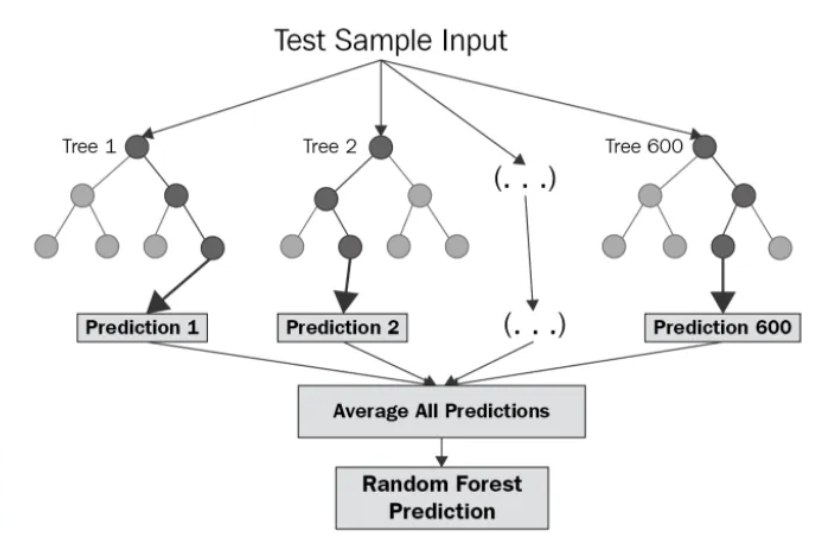

The Random Forest regression algorithm is an ensemble learning method that combines multiple Decision Trees to make predictions. It is a powerful supervised machine learning algorithm commonly used for regression tasks. Random Forest builds an ensemble of Decision Trees and aggregates their predictions to achieve more accurate and robust regression results.

Here's an overview of how the Random Forest regression algorithm works and the key parameters involved:

1. *Ensemble of Decision Trees:* Random Forest creates an ensemble of Decision Trees, where each tree is built on a randomly sampled subset of the training data and a randomly selected subset of features. Each tree is trained independently to make predictions.

2. *Random Sampling:* Random Forest applies a technique called bootstrapping, where it randomly selects subsets of the original training data with replacement. This random sampling creates diverse training sets for each tree, introducing variability and reducing overfitting.

3. *Feature Subsetting:* Random Forest randomly selects a subset of features to consider at each split point when building each Decision Tree. This technique, known as feature subsetting or random subspace method, helps to introduce randomness and decorrelation between the trees.

4. *Aggregating Predictions:* For regression, the predictions of individual Decision Trees are combined by taking the average (mean) of the predicted values. This aggregation helps to reduce the variance and noise in the predictions, leading to more stable and accurate results.

5. *Out-of-Bag (OOB) Error:* Random Forest can estimate the performance of the model without the need for a separate validation set. It uses the out-of-bag samples, which are the data points that were not included in the bootstrap sample for each tree, to calculate the OOB error. This error metric provides an indication of the model's performance on unseen data.

6. *Hyperparameters:* Random Forest has several important hyperparameters that can be tuned to control the ensemble's behavior and improve model performance. Some key hyperparameters include:

   * **Number of Trees:** Specifies the number of Decision Trees to be included in the ensemble. Increasing the number of trees generally improves performance but comes with a higher computational cost.

   * **Maximum Depth:** Sets the maximum depth or levels of each Decision Tree in the ensemble. It helps control the complexity and overfitting of the individual trees.

   * **Minimum Samples Split:** Specifies the minimum number of samples required to split an internal node in each Decision Tree.

   * **Maximum Features:** Controls the number of features considered for each split in each Decision Tree. It helps to introduce randomness and reduce correlation between the trees.

   * **Random State:** Sets a random seed to ensure reproducibility of the results.

7. *Feature Importance:* Random Forest provides a measure of feature importance, indicating the relative importance of each feature in making predictions. Feature importance is calculated based on how much each feature decreases the impurity or error when used for splitting across all the Decision Trees in the ensemble. It helps identify the most relevant features for the regression task.

8. *Handling Missing Data and Outliers:* Random Forest can handle missing data by using surrogate splits, which allow the algorithm to make splits even when a particular feature value is missing. Additionally, Random Forest is relatively robust to outliers due to the averaging of multiple trees, which helps reduce the impact of individual outliers on the final prediction.

Random Forest is known for its excellent performance in regression tasks. It can handle both numerical and categorical features, capture non-linear relationships, and automatically handle feature interactions. The ensemble nature of Random Forest reduces overfitting and provides more stable and reliable predictions compared to individual Decision Trees.

By adjusting the hyperparameters, such as the number of trees, maximum depth, and minimum samples split, you can control the complexity of the ensemble, balance between underfitting and overfitting, and optimize the model's performance. Additionally, analyzing feature importance can provide insights into the most influential features in the regression problem.

Overall, Random Forest is a versatile and powerful algorithm for regression tasks, offering robustness, interpretability, and high predictive accuracy.

#### Train Model

In [ ]:
rf = RandomForestRegressor(random_state=42)
rf.fit(X_train_scaled, y_train)

RandomForestRegressor(random_state=42)

#### Evaluate Model

In [ ]:
y_pred_rf = rf.predict(X_test_scaled)
mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f"Random Forest MSE: {mse_rf:.2f}")

Random Forest MSE: 0.26


In [ ]:
rf_r2 = r2_score(y_test, y_pred_dt)
print(f"RF R^2 Score: {rf_r2:.2f}")

RF R^2 Score: 0.62


#### Tune Model

In [ ]:
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'criterion': ['friedman_mse', 'absolute_error', 'squared_error']}

In [ ]:
rf = RandomForestRegressor(random_state=42)
grid_search_rf = GridSearchCV(estimator=rf, param_grid=param_grid_rf, cv=5)
grid_search_rf.fit(X_train_scaled, y_train)

In [ ]:
best_params_rf = grid_search_rf.best_params_
best_params_rf

In [ ]:
best_model_rf = grid_search_rf.best_estimator_
best_model_rf

In [ ]:
y_pred_best_rf = best_model_rf.predict(X_test_scaled)
mse_best_rf = mean_squared_error(y_test, y_pred_best_rf)
print(f"RF MSE: {mse_best_rf:.2f}")

In [ ]:
#rf_score = best_model_rf.score(y_test.values, y_pred_best_rf)
#print(f"RF R^2 Score: {rf_score:.2f}")

### SVM vs DT vs RF

In [ ]:
results = pd.DataFrame({
    'Model': ['SVM', 'Decision Tree', 'Random Forest'],
    'MSE': [mse_svm, mse_dt, mse_rf],
    'R^2 Score': [svm_r2, dt_r2, rf_r2]})
results

In [ ]:
fig = px.bar(results, x = 'Model', y = ['MSE', 'R^2 Score'],
             barmode = 'group', title = 'Model Comparison',
             labels = {'value': 'Score', 'variable': 'Metric'},
             template = 'plotly_white')

fig.show()

By comparing the bars in the chart, you can assess which model has the lowest MSE (indicating better prediction accuracy) and the highest R^2 score (indicating better fit and ability to explain variance). This visualization can help in visually comparing the performance of the three models and selecting the better model based on your evaluation criteria.

**Mean Squared Error (MSE):**

* MSE measures the average squared difference between the predicted values and the actual values of the target variable.
* Lower MSE values indicate better model performance, as they indicate that the model's predictions are closer to the actual values.
* Compare the MSE values of the three models and select the model with the lowest MSE. This model is likely to have the smallest average squared difference between predictions and actual values.

**Coefficient of Determination (R^2 score):**

* R^2 score represents the proportion of the variance in the target variable that can be explained by the model.
* R^2 score ranges between 0 and 1, where 1 indicates a perfect fit and 0 indicates that the model does not explain any of the variance in the target variable.
* Higher R^2 score values indicate better model performance, as they indicate that the model can explain a larger proportion of the variance in the target variable.
* Compare the R^2 score values of the three models and select the model with the highest R^2 score. This model is likely to have a better fit to the data and be able to explain more of the variance.

Consider the following scenarios for comparing the models:

1. If one model has both the lowest MSE and the highest R^2 score among the three models, it can be considered the best performing model in terms of prediction accuracy and capturing the variance in the target variable.

2. If there is a trade-off between MSE and R^2 score, you need to consider your specific requirements and priorities. For example, if minimizing prediction errors is crucial, focus more on the model with the lowest MSE. If capturing and explaining the variance in the target variable is more important, prioritize the model with the highest R^2 score.

3. It's important to consider the magnitude of the differences in MSE and R^2 score between the models. If the differences are relatively small, it may indicate that the models perform similarly. In such cases, other factors such as model complexity, interpretability, computational efficiency, and domain-specific considerations can help in making the final decision.

#### Comparing Tuned Models

In [ ]:
best_results = pd.DataFrame({
    'Model': ['SVM', 'Decision Tree', 'Random Forest'],
    'MSE': [mse_best_svm, mse_best_dt, mse_best_rf]})
    #'R^2 Score': [svm_score, dt_score, rf_score]})
best_results

In [ ]:
fig = px.bar(best_results, x = 'Model', y = ['MSE'],
             barmode = 'group', title = 'Model Comparison',
             labels = {'value': 'Score', 'variable': 'Metric'},
             template = 'plotly_white')

fig.show()